In [99]:
# ! conda activate 
# ! pip install "tensorflow<2.11" --force-reinstall --user
# TODO: If error, use pip list and check that all "tensor..." packages are < 2.11. I personally got problems with "tensorflow-intel"
# ! pip install keras

In [100]:
import numpy as np

import tensorflow as tf

# ! pip install tensorflow-datasets
import tensorflow_datasets

from tensorflow import keras
from tensorflow.keras import layers

# ! pip install keras-tuner --upgrade
import keras_tuner

In [101]:
train = 112800 # 
test = 18800

total = train+test

train_f = train/total
test_f  = test/total

print(f"The original TRAIN split size is {round(train_f*100,2)}% of the full dataset")
print(f"The original TEST  split size is {round(test_f*100,2)}% of the full dataset")

# I want the validation set size to be equal to VALUE_I_WANT compared to the total dataset size, but i have to extract it only from the training split, with size 85%  
# x*.85 = VALUE_I_WANT => x = VALUE_I_WANT/.85   where x is the valid set size extracted from the train split
VALID_SIZE_I_WANT = .25
VALID_SIZE_TO_PASS = VALID_SIZE_I_WANT / train_f
VALID_SIZE_TO_PASS = round(VALID_SIZE_TO_PASS*100)
print(VALID_SIZE_TO_PASS)


The original TRAIN split size is 85.71% of the full dataset
The original TEST  split size is 14.29% of the full dataset
29


In [102]:
# Load the EMNIST dataset
test_ds, valid_ds, train_ds = tensorflow_datasets.load(name='emnist/balanced', split=["test", f"train[0%:{VALID_SIZE_TO_PASS}%]", f"train[{VALID_SIZE_TO_PASS}%:]"], as_supervised=True, shuffle_files=True)

print(f"Length of TRAIN = {len(train_ds)}")
print(f"Length of VALID = {len(valid_ds)}")
print(f"Length of TEST = {len(test_ds)}")

# Normalize the pixel values
def normalize_img(image, label):
    return tf.cast(image, tf.float32) / 255., label

def standardize_img(image, label):
    return (tf.cast(image, tf.float32) - tf.math.reduce_mean(image)) / tf.math.reduce_std(image), label
def flip_updown_img(image, label):
    return tf.image.flip_up_down(image), label
def rotate_minus270(image, label):
    return tf.image.rot90(image,k=3), label
def reshape(image, label, k):
    return tf.image.resize(image, (k, k)),label
def gray_to_rgb(image, label):
    return tf.image.grayscale_to_rgb(image), label  

# Set batch size and prefetching
BATCH_SIZE = 256

## custom
train_ds = train_ds.map(normalize_img).map(standardize_img).map(flip_updown_img).map(rotate_minus270)
test_ds = test_ds.map(normalize_img).map(standardize_img).map(flip_updown_img).map(rotate_minus270)
valid_ds = valid_ds.map(normalize_img).map(standardize_img).map(flip_updown_img).map(rotate_minus270)
####################

## We're gonna need this for the pre-trained cnn
train_ds2_TMP = train_ds
valid_ds2_TMP = valid_ds
test_ds2_TMP = test_ds
####################


# custom
train_ds = train_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
valid_ds = valid_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
####################

Length of TRAIN = 80088
Length of VALID = 32712
Length of TEST = 18800


(256, 28, 28, 1)
avg mean = -1.0643686820799303e-08
avg std = 0.84063321352005


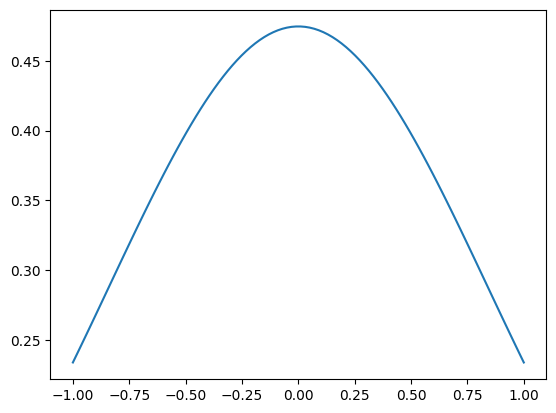

(256, 28, 28, 1)
avg mean = -1.0643686820799303e-08
avg std = 0.84063321352005


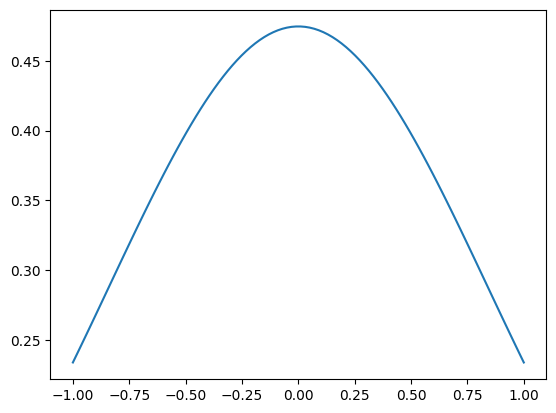

(256, 28, 28, 1)
avg mean = -1.0643686820799303e-08
avg std = 0.84063321352005


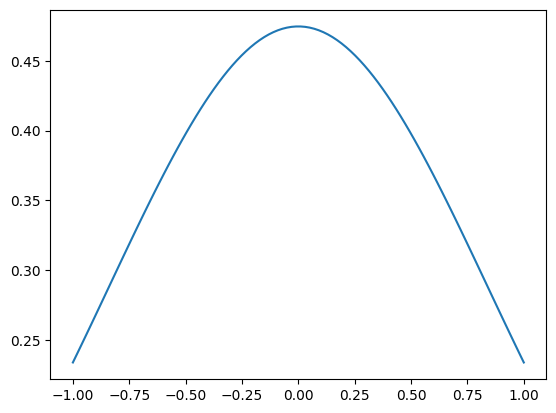

In [228]:
# plot the distribution of the first batch of the training set
import matplotlib.pyplot as plt
import numpy as np

def plot_distribution(ii):
    # Get the first batch of the training set
    images, labels = train_ds.take(ii).as_numpy_iterator().next()

    # for each feature column, get the mean and std
    means=[]
    stds=[]
    print(images.shape)
    for i in range(28):
        tmp_mean = np.mean(images[:,:,i,:])
        tmp_std = np.std(images[:,:,i,:])
        
        # add it in a list
        means.append(tmp_mean)
        stds.append(tmp_std)

    # do the average of the means and stds
    mean = np.mean(means)
    std = np.mean(stds)

    print(f"avg mean = {mean}")
    print(f"avg std = {std}")

    # plot the distribution curve with the mean and std
    x = np.linspace(-1, 1, 100)
    y = 1/(std * np.sqrt(2 * np.pi)) * np.exp( - (x - mean)**2 / (2 * std**2) )

    plt.plot(x, y)
    plt.show()

plot_distribution(1)
plot_distribution(20)
plot_distribution(100)


In [104]:
import string
def map_labels_to_ascii(c):
  _merged_classes = {"c", "i", "j", "k", "l", "m", "o", "p", "s", "u", "v", "w", "x", "y", "z"}
  _all_classes = set(string.digits + string.ascii_letters)
  current = sorted(list(_all_classes - _merged_classes))
  out = current[c]
  full_out = f"{out}/{out.lower()}" if out.lower() in _merged_classes else out 
  return full_out

In [157]:
# ! pip install matplotlib
import matplotlib.pyplot as plt

def plot_images(ds, n_img_to_show=9,nrows=3, ncols=3):
    if nrows*ncols < n_img_to_show:
        raise ValueError("nrows*ncols must be >= n_img_to_show")
    
    # choose a random batch
    b=np.random.randint(0, len(ds))
    for images, labels in ds.take(b):
        for i in range(n_img_to_show):
            ax = plt.subplot(nrows, ncols, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(map_labels_to_ascii(int(labels[i])))
            plt.axis("off")

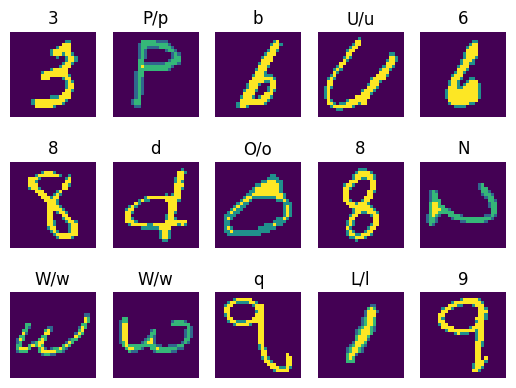

In [106]:
plot_images(train_ds,n_img_to_show=15, nrows=3, ncols=5)

## MODEL WITHOUT TUNING the HPs

In [107]:
INPUT_SHAPE, N_CLASSES = (28,28,1),47

def make_model_notuning(n_layers_with_padding, n_layers_WITHOUT_padding,nF1, doUseBias, doBatchNorm, dropout, activation_fun_str, optimizer_str, lr, wd):
  assert activation_fun_str in ["relu", "leaky_relu"]
  assert optimizer_str in ["adam", "sgd"]

  layers_with_padding = []
  for i in range(n_layers_with_padding):
    layers_with_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), padding="same" , activation=activation_fun_str, use_bias=doUseBias) )
    if doBatchNorm:
      layers_with_padding.append( layers.BatchNormalization() )
    layers_with_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(1,1),padding="same") )

  layers_WITHOUT_padding = []
  for i in range(n_layers_WITHOUT_padding):
    layers_WITHOUT_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), activation=activation_fun_str,  use_bias=doUseBias) )
    if doBatchNorm:
      layers_WITHOUT_padding.append( layers.BatchNormalization() )
    layers_WITHOUT_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2)) )
    layers_WITHOUT_padding.append(layers.Dropout(dropout))


  model = keras.Sequential(
      [
          keras.Input(shape=INPUT_SHAPE),
          *layers_with_padding,
          *layers_WITHOUT_padding,
          layers.Flatten(),
          layers.Dense(N_CLASSES, activation="softmax"),
      ]
  )
  
  
  if optimizer_str == "adam":
    my_optimizer = keras.optimizers.Adam(learning_rate=lr, decay=wd) 
  elif optimizer_str == "sgd":
    my_optimizer = keras.optimizers.SGD(learning_rate=lr, decay=wd)

  model.compile(
    optimizer=my_optimizer ,
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.SparseTopKCategoricalAccuracy(
    k=5, name="sparse_top_k_categorical_accuracy", dtype=None
  )],
  )
  return model

model = make_model_notuning(doUseBias=True, n_layers_with_padding=3,n_layers_WITHOUT_padding=2,nF1=32, doBatchNorm=True,dropout=0.5, activation_fun_str="leaky_relu", optimizer_str="adam", lr=0.001, wd=0.001)

In [108]:
# BEST hp:  {'DO_USE_BIAS': False, 'N_LAYER_WITH_PADDING': 4, 'N_LAYER_WITHOUT_PADDING': 2, 'ACTIVATION_FUN_STR': 'leaky_relu', 'N_CHANNEL_CONV1': 16, 'doBatchNorm': True, 'DROPOUT': 0.2, 'OPTIMIZER_STR': 'adam', 'LR': 0.01, 'WD': 0.01}
# WOEST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 3, 'N_LAYER_WITHOUT_PADDING': 3, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 2, 'doBatchNorm': False, 'DROPOUT': 0.0, 'OPTIMIZER_STR': 'sgd', 'LR': 0.0001, 'WD': 0.01}

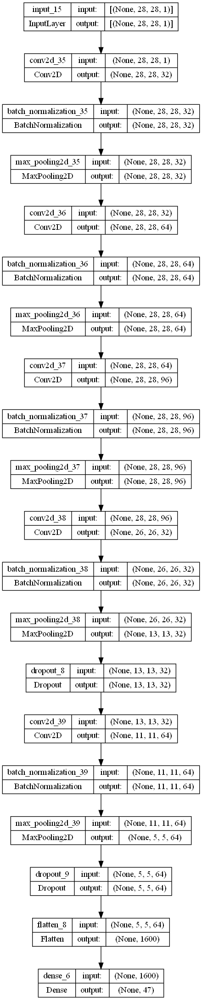

In [109]:
# ! pip install pydot
# ! conda install graphviz
# ! conda install python-graphviz

keras.utils.plot_model(model, show_shapes=True)

In [110]:
EPOCHS = 30
TRAIN_LOSS, TRAIN_ACC, VAL_LOSS, VAL_ACC ="loss","accuracy","val_loss","val_accuracy"

In [111]:
callbacks = [
    # keras.callbacks.ModelCheckpoint("./checkpoints/no_tuning/save_at_{epoch}.keras"),
    tf.keras.callbacks.EarlyStopping(VAL_LOSS, patience=3, restore_best_weights=True)
]

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=valid_ds,
)

Epoch 1/30
313/313 [==============================] - 21s 62ms/step - loss: 1.3303 - accuracy: 0.6501 - sparse_top_k_categorical_accuracy: 0.9024 - val_loss: 4.8397 - val_accuracy: 0.1220 - val_sparse_top_k_categorical_accuracy: 0.4921
Epoch 2/30
313/313 [==============================] - 18s 56ms/step - loss: 0.6166 - accuracy: 0.8019 - sparse_top_k_categorical_accuracy: 0.9807 - val_loss: 0.5563 - val_accuracy: 0.8139 - val_sparse_top_k_categorical_accuracy: 0.9826
Epoch 3/30
313/313 [==============================] - 18s 56ms/step - loss: 0.5213 - accuracy: 0.8280 - sparse_top_k_categorical_accuracy: 0.9854 - val_loss: 0.4416 - val_accuracy: 0.8514 - val_sparse_top_k_categorical_accuracy: 0.9883
Epoch 4/30
313/313 [==============================] - 18s 56ms/step - loss: 0.4719 - accuracy: 0.8410 - sparse_top_k_categorical_accuracy: 0.9881 - val_loss: 0.4132 - val_accuracy: 0.8625 - val_sparse_top_k_categorical_accuracy: 0.9897
Epoch 5/30
313/313 [==============================] - 18

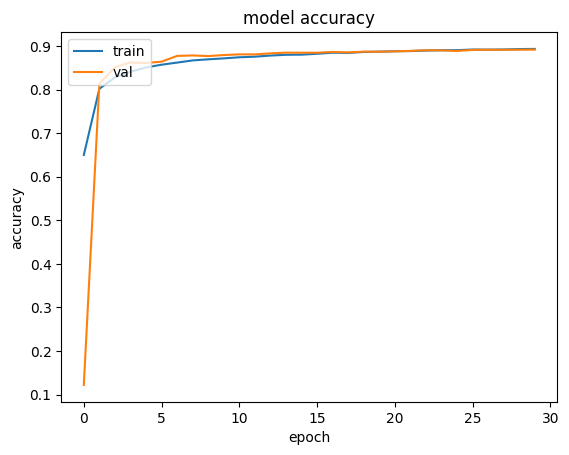

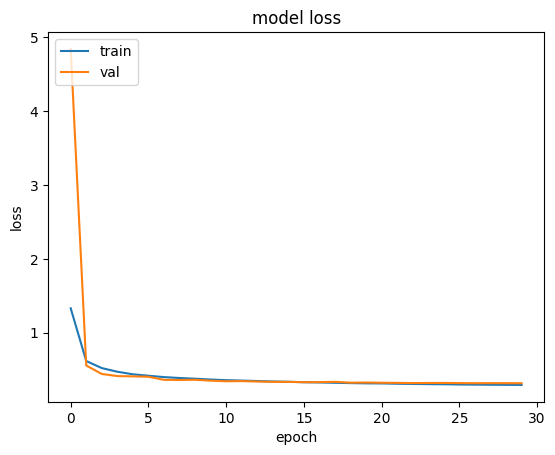

In [112]:
# print(history.history.keys())

def plot_metric(history, metric_name):
    plt.plot(history.history[metric_name])
    plt.plot(history.history[f'val_{metric_name}'])
    plt.title(f'model {metric_name}')
    plt.ylabel(metric_name)
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

plot_metric(history, TRAIN_ACC)
plot_metric(history, TRAIN_LOSS)

In [113]:
def print_all_metrics(model, score):
    print("METRICS TEST")
    for i,v in enumerate(model.metrics_names):
        print(f"Test [{v}] = {score[i]}")
    print("")
        
# Testing
score = model.evaluate(test_ds)
print_all_metrics(model, score)

74/74 [==============================] - 1s 16ms/step - loss: 0.3310 - accuracy: 0.8869 - sparse_top_k_categorical_accuracy: 0.9939
METRICS TEST
Test [loss] = 0.33099284768104553
Test [accuracy] = 0.8868616819381714
Test [sparse_top_k_categorical_accuracy] = 0.993882954120636



## LET'S TUNE THE HPs

In [114]:
def make_model_with_tuning(hp):
  DO_USE_BIAS=hp.Boolean("DO_USE_BIAS")

  N_LAYER_WITH_PADDING = hp.Int("N_LAYER_WITH_PADDING", min_value=0, max_value=5, step=1)
  N_LAYER_WITHOUT_PADDING = hp.Int("N_LAYER_WITHOUT_PADDING", min_value=1, max_value=3, step=1)

  ACTIVATION_FUN_STR = hp.Choice("ACTIVATION_FUN_STR", values=["relu", "leaky_relu"])
  N_CHANNEL1=hp.Int("N_CHANNEL_CONV1", min_value=2, max_value=32, step=2, sampling="log")
  # CONV_SIZE1 = hp.Int("CONV_SIZE1", min_value=3, max_value=9)

  doBatchNorm = hp.Boolean("doBatchNorm")
  DROPOUT=hp.Float("DROPOUT", min_value=0.0, max_value=0.8, step=0.1)

  OPTIMIZER_STR = hp.Choice("OPTIMIZER_STR", values=["adam", "sgd"])
  LR = hp.Float("LR", min_value=1e-4, max_value=1e-2, step=10, sampling="log")
  WD = hp.Float("WD", min_value=1e-4, max_value=1e-2, step=10, sampling="log")

  model=make_model_notuning(doUseBias=DO_USE_BIAS,n_layers_with_padding=N_LAYER_WITH_PADDING, n_layers_WITHOUT_padding=N_LAYER_WITHOUT_PADDING,nF1=N_CHANNEL1, doBatchNorm=doBatchNorm,dropout=DROPOUT, activation_fun_str=ACTIVATION_FUN_STR, optimizer_str=OPTIMIZER_STR, lr=LR, wd=WD)
  return model

# keras.utils.plot_model(model, show_shapes=True)

### First experimemnts

In [115]:
def run_tuner_with_n_trials(train_ds, valid_ds, epochs, n_trials, early_stop_metric=VAL_LOSS, early_stop_patience=3, tuner_objective=VAL_ACC):
    callbacks2 = [
        # keras.callbacks.ModelCheckpoint("./checkpoints/random_search/save_at_{epoch}.keras"),
        tf.keras.callbacks.TensorBoard("./tmp/tb_logs"),
        tf.keras.callbacks.EarlyStopping(early_stop_metric, patience=early_stop_patience, restore_best_weights=True)
    ]

    tuner = keras_tuner.RandomSearch(
        hypermodel=make_model_with_tuning,
        objective=tuner_objective,
        max_trials=n_trials,
        seed=42,
        executions_per_trial=1,
        overwrite=True,
        directory=f"./with_tuning_{n_trials}_trials",
        project_name=f"keras_tuner_random_search_with_{n_trials}_trials",
    )
    tuner.search_space_summary()

    tuner.search(train_ds, epochs=epochs, validation_data=valid_ds, callbacks=callbacks2)

    # Get THE HYPERPARAMETERS
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    worst_hp = tuner.get_best_hyperparameters(num_trials=99999)[-1]
    print("HYPERSPACE SUMMARY")
    print("BEST hp: ", best_hp.values)
    print("WORST hp: ", worst_hp.values)
    print("")

    # GETTHE BEST MODEL
    best_model = tuner.get_best_models()[0]
    # Test the best model
    score = best_model.evaluate(test_ds)
    print_all_metrics(best_model, score)

    # GET THE WORST MODEL
    worst_model = tuner.get_best_models(num_models=99999)[-1]
    # Testing the best model
    score = worst_model.evaluate(test_ds)
    print_all_metrics(worst_model, score)

    # SAVE TO DISK
    #save the best model to disk
    best_model.save("best_model.h5")
    #save the worst model to disk
    worst_model.save("worst_model.h5")

#### 25

In [116]:
run_tuner_with_n_trials(train_ds, valid_ds, epochs=EPOCHS, n_trials=25)

Trial 25 Complete [00h 03m 52s]
val_accuracy: 0.6389704346656799

Best val_accuracy So Far: 0.8795243501663208
Total elapsed time: 01h 10m 04s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


HYPERSPACE SUMMARY
BEST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 0, 'N_LAYER_WITHOUT_PADDING': 2, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 32, 'doBatchNorm': False, 'DROPOUT': 0.4, 'OPTIMIZER_STR': 'adam', 'LR': 0.001, 'WD': 0.0001}
WORST hp:  {'DO_USE_BIAS': False, 'N_LAYER_WITH_PADDING': 1, 'N_LAYER_WITHOUT_PADDING': 3, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 2, 'doBatchNorm': True, 'DROPOUT': 0.8, 'OPTIMIZER_STR': 'sgd', 'LR': 0.0001, 'WD': 0.001}

74/74 [==============================] - 1s 4ms/step - loss: 0.3643 - accuracy: 0.8796 - sparse_top_k_categorical_accuracy: 0.9929
METRICS TEST
Test [loss] = 0.3642737865447998
Test [accuracy] = 0.8795744776725769
Test [sparse_top_k_categorical_accuracy] = 0.9928723573684692



74/74 [==============================] - 1s 10ms/step - loss: 3.8696 - accuracy: 0.0159 - sparse_top_k_categorical_accuracy: 0.0935
METRICS TEST
Test [loss] = 3.8696014881134033
Test [accuracy] = 0.015851063653826714
Test [sparse_top_k_categorical_accuracy] = 0.09351063519716263



#### 50

In [117]:
run_tuner_with_n_trials(train_ds, valid_ds, epochs=EPOCHS, n_trials=50)

Trial 50 Complete [00h 02m 48s]
val_accuracy: 0.8837124109268188

Best val_accuracy So Far: 0.8864942789077759
Total elapsed time: 02h 11m 43s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


HYPERSPACE SUMMARY
BEST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 5, 'N_LAYER_WITHOUT_PADDING': 2, 'ACTIVATION_FUN_STR': 'leaky_relu', 'N_CHANNEL_CONV1': 16, 'doBatchNorm': False, 'DROPOUT': 0.4, 'OPTIMIZER_STR': 'adam', 'LR': 0.01, 'WD': 0.001}
WORST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 2, 'N_LAYER_WITHOUT_PADDING': 3, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 2, 'doBatchNorm': False, 'DROPOUT': 0.8, 'OPTIMIZER_STR': 'adam', 'LR': 0.0001, 'WD': 0.001}

74/74 [==============================] - 2s 17ms/step - loss: 0.3365 - accuracy: 0.8868 - sparse_top_k_categorical_accuracy: 0.9946
METRICS TEST
Test [loss] = 0.336484432220459
Test [accuracy] = 0.8867553472518921
Test [sparse_top_k_categorical_accuracy] = 0.9946276545524597



74/74 [==============================] - 1s 9ms/step - loss: 3.8504 - accuracy: 0.0201 - sparse_top_k_categorical_accuracy: 0.1090
METRICS TEST
Test [loss] = 3.8503847122192383
Test [accuracy] = 0.020053191110491753
Test [sparse_top_k_categorical_accuracy] = 0.10898936539888382



#### 75

In [118]:
run_tuner_with_n_trials(train_ds, valid_ds, epochs=EPOCHS, n_trials=75)

Trial 75 Complete [00h 06m 53s]
val_accuracy: 0.863047182559967

Best val_accuracy So Far: 0.8858828544616699
Total elapsed time: 03h 14m 43s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


HYPERSPACE SUMMARY
BEST hp:  {'DO_USE_BIAS': False, 'N_LAYER_WITH_PADDING': 2, 'N_LAYER_WITHOUT_PADDING': 2, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 16, 'doBatchNorm': True, 'DROPOUT': 0.2, 'OPTIMIZER_STR': 'adam', 'LR': 0.001, 'WD': 0.001}
WORST hp:  {'DO_USE_BIAS': False, 'N_LAYER_WITH_PADDING': 4, 'N_LAYER_WITHOUT_PADDING': 1, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 8, 'doBatchNorm': False, 'DROPOUT': 0.0, 'OPTIMIZER_STR': 'sgd', 'LR': 0.0001, 'WD': 0.01}

74/74 [==============================] - 1s 5ms/step - loss: 0.3424 - accuracy: 0.8814 - sparse_top_k_categorical_accuracy: 0.9929
METRICS TEST
Test [loss] = 0.34238576889038086
Test [accuracy] = 0.8814361691474915
Test [sparse_top_k_categorical_accuracy] = 0.9928723573684692



74/74 [==============================] - 1s 6ms/step - loss: 3.8793 - accuracy: 0.0101 - sparse_top_k_categorical_accuracy: 0.0690
METRICS TEST
Test [loss] = 3.879324197769165
Test [accuracy] = 0.01005319133400917
Test [sparse_top_k_categorical_accuracy] = 0.0689893588423729



#### 100

In [119]:
run_tuner_with_n_trials(train_ds, valid_ds, epochs=EPOCHS, n_trials=100)

Trial 100 Complete [00h 03m 57s]
val_accuracy: 0.02084861882030964

Best val_accuracy So Far: 0.8881144523620605
Total elapsed time: 04h 08m 58s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


HYPERSPACE SUMMARY
BEST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 5, 'N_LAYER_WITHOUT_PADDING': 2, 'ACTIVATION_FUN_STR': 'leaky_relu', 'N_CHANNEL_CONV1': 16, 'doBatchNorm': False, 'DROPOUT': 0.4, 'OPTIMIZER_STR': 'adam', 'LR': 0.01, 'WD': 0.001}
WORST hp:  {'DO_USE_BIAS': True, 'N_LAYER_WITH_PADDING': 2, 'N_LAYER_WITHOUT_PADDING': 3, 'ACTIVATION_FUN_STR': 'relu', 'N_CHANNEL_CONV1': 4, 'doBatchNorm': True, 'DROPOUT': 0.4, 'OPTIMIZER_STR': 'sgd', 'LR': 0.0001, 'WD': 0.01}

74/74 [==============================] - 1s 16ms/step - loss: 0.3313 - accuracy: 0.8857 - sparse_top_k_categorical_accuracy: 0.9935
METRICS TEST
Test [loss] = 0.3312912583351135
Test [accuracy] = 0.8857446908950806
Test [sparse_top_k_categorical_accuracy] = 0.9934574365615845



74/74 [==============================] - 1s 7ms/step - loss: 3.9164 - accuracy: 0.0171 - sparse_top_k_categorical_accuracy: 0.0941
METRICS TEST
Test [loss] = 3.916410446166992
Test [accuracy] = 0.017127659171819687
Test [sparse_top_k_categorical_accuracy] = 0.09409574419260025



### Esperiments modified

In [120]:
def make_model_with_tuning_with_specialized_hp(hp):
  # DO_USE_BIAS=hp.Boolean("DO_USE_BIAS")
  DO_USE_BIAS = False

  N_LAYER_WITH_PADDING = 5
  N_LAYER_WITHOUT_PADDING = 2

  ACTIVATION_FUN_STR = "leaky_relu"

  N_CHANNEL1=hp.Int("N_CHANNEL_CONV1", min_value=16, max_value=64, step=2, sampling="log")

  # doBatchNorm = hp.Boolean("doBatchNorm")
  doBatchNorm = False
  DROPOUT=hp.Float("DROPOUT", min_value=0.2, max_value=0.4, step=0.1)

  OPTIMIZER_STR = "adam"
  LR = hp.Float("LR", min_value=1e-3, max_value=1e-2, step=10, sampling="log")
  WD = hp.Float("WD", min_value=1e-3, max_value=1e-3, step=10, sampling="log")

  model=make_model_notuning(doUseBias=DO_USE_BIAS,n_layers_with_padding=N_LAYER_WITH_PADDING, n_layers_WITHOUT_padding=N_LAYER_WITHOUT_PADDING,nF1=N_CHANNEL1, doBatchNorm=doBatchNorm,dropout=DROPOUT, activation_fun_str=ACTIVATION_FUN_STR, optimizer_str=OPTIMIZER_STR, lr=LR, wd=WD)
  return model

# keras.utils.plot_model(model, show_shapes=True)

In [121]:
def run_specialized_tuner_with_n_trials(train_ds, valid_ds, epochs, n_trials, early_stop_metric=VAL_LOSS, early_stop_patience=3, tuner_objective=VAL_ACC):
    callbacks2 = [
        # keras.callbacks.ModelCheckpoint("./checkpoints/random_search/save_at_{epoch}.keras"),
        # tf.keras.callbacks.TensorBoard("./tmp/tb_logs"),
        tf.keras.callbacks.EarlyStopping(early_stop_metric, patience=early_stop_patience, restore_best_weights=True)
    ]

    tuner = keras_tuner.RandomSearch(
        hypermodel=make_model_with_tuning_with_specialized_hp,
        objective=tuner_objective,
        max_trials=n_trials,
        seed=42,
        executions_per_trial=1,
        overwrite=True,
        directory=f"./with_tuning_(specialized)_{n_trials}_trials",
        project_name=f"keras_tuner_random_search_with_{n_trials}_trials_and_specialized_hp",
    )
    tuner.search_space_summary()

    tuner.search(train_ds, epochs=epochs, validation_data=valid_ds, callbacks=callbacks2)

    # Get THE HYPERPARAMETERS
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    worst_hp = tuner.get_best_hyperparameters(num_trials=99999)[-1]
    print("HYPERSPACE SUMMARY")
    print("BEST hp: ", best_hp.values)
    print("WORST hp: ", worst_hp.values)
    print("")

    # GETTHE BEST MODEL
    best_model = tuner.get_best_models()[0]
    # Test the best model
    score = best_model.evaluate(test_ds)
    print_all_metrics(best_model, score)

    # GET THE WORST MODEL
    worst_model = tuner.get_best_models(num_models=99999)[-1]
    # Testing the best model
    score = worst_model.evaluate(test_ds)
    print_all_metrics(worst_model, score)

    # SAVE TO DISK
    #save the best model to disk
    best_model.save("best_specialized_model.h5")
    #save the worst model to disk
    worst_model.save("worst_specialized_model.h5")

#### Specialized experiments

In [122]:
EPOCHS_WITH_SPECIALIZED_HP = 100

In [123]:
run_specialized_tuner_with_n_trials(train_ds, valid_ds, epochs=EPOCHS_WITH_SPECIALIZED_HP, n_trials=100)

Trial 18 Complete [00h 08m 10s]
val_accuracy: 0.888053297996521

Best val_accuracy So Far: 0.891477108001709
Total elapsed time: 02h 56m 13s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


HYPERSPACE SUMMARY
BEST hp:  {'N_CHANNEL_CONV1': 32, 'DROPOUT': 0.2, 'LR': 0.001, 'WD': 0.001}
WORST hp:  {'N_CHANNEL_CONV1': 64, 'DROPOUT': 0.4, 'LR': 0.01, 'WD': 0.001}

74/74 [==============================] - 2s 23ms/step - loss: 0.3201 - accuracy: 0.8922 - sparse_top_k_categorical_accuracy: 0.9947
METRICS TEST
Test [loss] = 0.3201436996459961
Test [accuracy] = 0.8922340273857117
Test [sparse_top_k_categorical_accuracy] = 0.9947340488433838



74/74 [==============================] - 5s 52ms/step - loss: 0.3669 - accuracy: 0.8781 - sparse_top_k_categorical_accuracy: 0.9924
METRICS TEST
Test [loss] = 0.36693334579467773
Test [accuracy] = 0.8780850768089294
Test [sparse_top_k_categorical_accuracy] = 0.992446780204773



# RESULTS ANALYSIS

Epoch 1/100
313/313 [==============================] - 29s 89ms/step - loss: 1.0669 - accuracy: 0.7006 - sparse_top_k_categorical_accuracy: 0.9277 - val_loss: 4.8115 - val_accuracy: 0.1370 - val_sparse_top_k_categorical_accuracy: 0.5280
Epoch 2/100
313/313 [==============================] - 28s 90ms/step - loss: 0.5248 - accuracy: 0.8265 - sparse_top_k_categorical_accuracy: 0.9854 - val_loss: 0.4670 - val_accuracy: 0.8431 - val_sparse_top_k_categorical_accuracy: 0.9885
Epoch 3/100
313/313 [==============================] - 28s 90ms/step - loss: 0.4461 - accuracy: 0.8478 - sparse_top_k_categorical_accuracy: 0.9895 - val_loss: 0.4037 - val_accuracy: 0.8642 - val_sparse_top_k_categorical_accuracy: 0.9906
Epoch 4/100
313/313 [==============================] - 28s 90ms/step - loss: 0.4055 - accuracy: 0.8598 - sparse_top_k_categorical_accuracy: 0.9916 - val_loss: 0.3744 - val_accuracy: 0.8721 - val_sparse_top_k_categorical_accuracy: 0.9928
Epoch 5/100
313/313 [==============================]

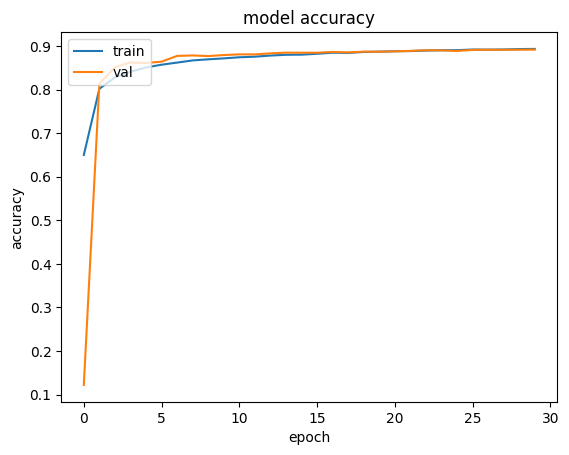

74/74 [==============================] - 1s 16ms/step - loss: 0.3310 - accuracy: 0.8869 - sparse_top_k_categorical_accuracy: 0.9939
METRICS TEST
Test [loss] = 0.33099284768104553
Test [accuracy] = 0.8868616819381714
Test [sparse_top_k_categorical_accuracy] = 0.993882954120636



In [124]:
model2 = make_model_notuning(doUseBias=True, n_layers_with_padding=4,n_layers_WITHOUT_padding=2,nF1=32, doBatchNorm=True,dropout=0.4, activation_fun_str="leaky_relu", optimizer_str="adam", lr=0.001, wd=0.001)

callbacks3 = [
    tf.keras.callbacks.EarlyStopping(VAL_LOSS, patience=5, restore_best_weights=True)
]

history2 = model2.fit(
    train_ds,
    epochs=EPOCHS_WITH_SPECIALIZED_HP,
    callbacks=callbacks3,
    validation_data=valid_ds,
)

plot_metric(history, TRAIN_ACC)

score2 = model.evaluate(test_ds)
print_all_metrics(model, score2)

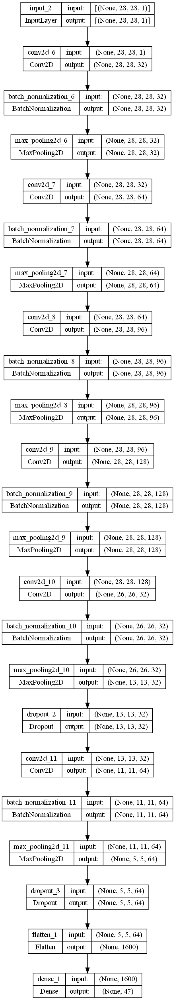

In [207]:
keras.utils.plot_model(model2, show_shapes=True)

74/74 [==============================] - 1s 14ms/step


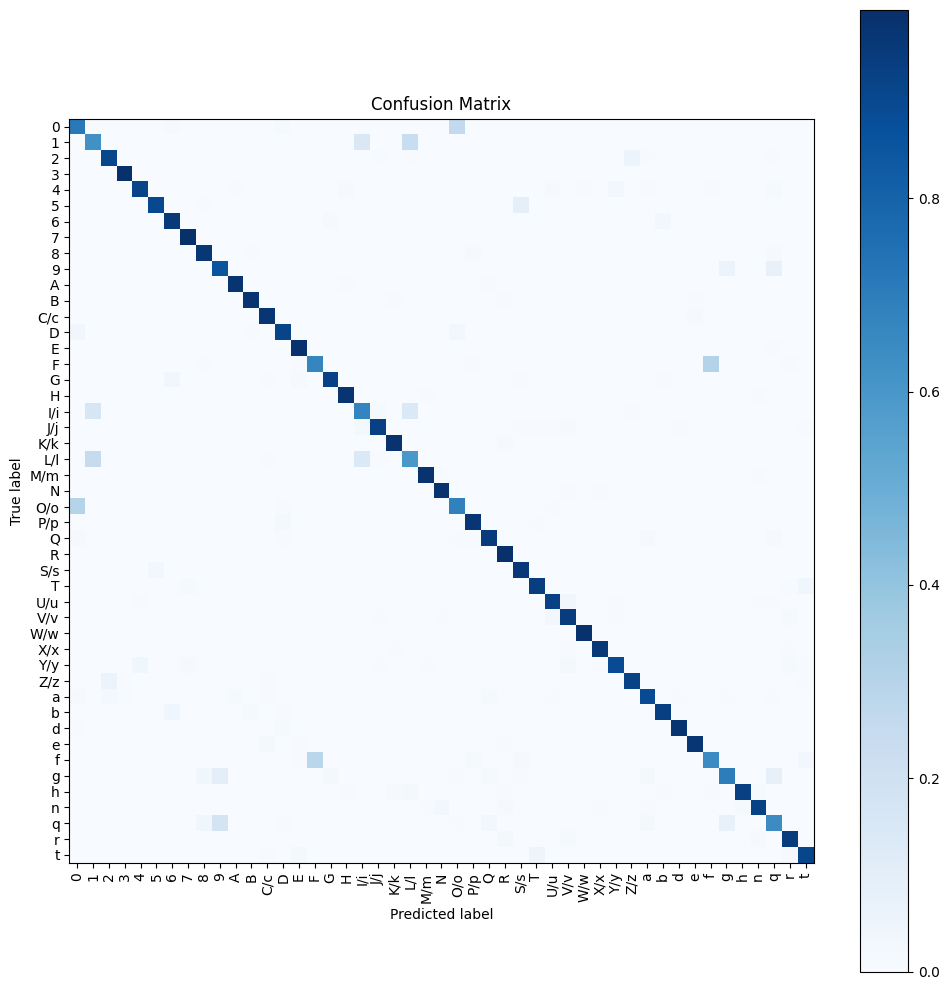

In [125]:
y_test = []
# Iterate over the batches of data
for batch_data, batch_labels in test_ds:
    # Append the batch labels to the list of labels
    y_test.append(batch_labels)
# Concatenate the list of labels into a single numpy array
y_test = tf.concat(y_test, axis=0).numpy()


from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#Predict
y_model = model.predict(test_ds)
y_model = np.argmax (y_model, axis = 1)


#Create confusion matrix and normalizes it over predicted (columns)
cm = confusion_matrix(y_test, y_model , normalize='pred')

# Define the class names
class_names = [f'{map_labels_to_ascii(i)}' for i in range(47)]

# Compute the confusion matrix
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Create a new figure with a larger size
plt.figure(figsize=(10, 10))

# Plot the confusion matrix
plt.imshow(cm_norm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=90)
plt.yticks(tick_marks, class_names)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Show the plot
plt.show()


# Let's use a pre-trained model

In [126]:
MY_K=224
train_ds2 = train_ds2_TMP.map(lambda i, l : reshape(i,l,MY_K)).map(gray_to_rgb)
valid_ds2 = valid_ds2_TMP.map(lambda i, l : reshape(i,l,MY_K)).map(gray_to_rgb)
test_ds2 = test_ds2_TMP.map(lambda i, l : reshape(i,l,MY_K)).map(gray_to_rgb)
#
train_ds2 = train_ds2.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
test_ds2 = test_ds2.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
valid_ds2 = valid_ds2.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [127]:
base_model = keras.applications.MobileNetV3Small(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(MY_K, MY_K, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

In [128]:
base_model.trainable = False

In [134]:
# keras.utils.plot_model(base_model, show_shapes=True)

In [129]:
n_layers_with_padding = 4
n_layers_WITHOUT_padding = 1
doBatchNorm = True
layers_with_padding = []
nF1 = 32
activation_fun_str = "leaky_relu"
doUseBias = False
dropout = 0.4

for i in range(n_layers_with_padding):
    layers_with_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), padding="same" , activation=activation_fun_str, use_bias=doUseBias) )
    if doBatchNorm:
        layers_with_padding.append( layers.BatchNormalization() )
    layers_with_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(1,1),padding="same") )

layers_WITHOUT_padding = []
for i in range(n_layers_WITHOUT_padding):
    layers_WITHOUT_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), activation=activation_fun_str,  use_bias=doUseBias) )
    if doBatchNorm:
        layers_WITHOUT_padding.append( layers.BatchNormalization() )
    layers_WITHOUT_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2)) )
    layers_WITHOUT_padding.append(layers.Dropout(dropout))


model_who_transfer_learning_is_applied = keras.Sequential(
    [
        # keras.Input(shape=INPUT_SHAPE),
        *layers_with_padding,
        *layers_WITHOUT_padding,
        # layers.Flatten(),
        # layers.Dense(N_CLASSES, activation="softmax"),
    ]
)

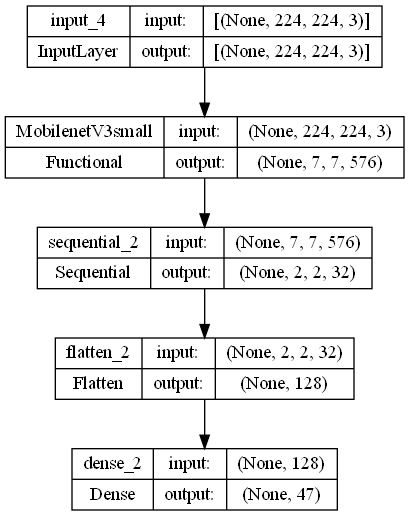

In [130]:
inputs = tf.keras.Input(shape=(MY_K, MY_K, 3))

# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = model_who_transfer_learning_is_applied(x)
x = layers.Flatten()(x)

# A Dense classifier with a single unit (binary classification)
outputs = tf.keras.layers.Dense(N_CLASSES, activation="softmax")(x)
special_model = tf.keras.Model(inputs,outputs)

keras.utils.plot_model(special_model, show_shapes=True)

In [131]:
callbacks4 = [
    tf.keras.callbacks.EarlyStopping(VAL_LOSS, patience=3, restore_best_weights=True)
]
EPOCHS_TRANSFER_LEARNING = 30
special_model.compile(optimizer=keras.optimizers.Adam(),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="sparse_top_k_categorical_accuracy", dtype=None)]
              )
special_model.fit(train_ds2, epochs=EPOCHS_TRANSFER_LEARNING, callbacks=callbacks4, validation_data=valid_ds2)

# Testing
score = special_model.evaluate(test_ds2)
print_all_metrics(special_model, score)

Epoch 1/30
313/313 [==============================] - 49s 146ms/step - loss: 1.2800 - accuracy: 0.6271 - sparse_top_k_categorical_accuracy: 0.8857 - val_loss: 0.8810 - val_accuracy: 0.7114 - val_sparse_top_k_categorical_accuracy: 0.9671
Epoch 2/30
313/313 [==============================] - 45s 144ms/step - loss: 0.5730 - accuracy: 0.8086 - sparse_top_k_categorical_accuracy: 0.9821 - val_loss: 0.6234 - val_accuracy: 0.7885 - val_sparse_top_k_categorical_accuracy: 0.9802
Epoch 3/30
313/313 [==============================] - 45s 144ms/step - loss: 0.4723 - accuracy: 0.8377 - sparse_top_k_categorical_accuracy: 0.9882 - val_loss: 0.9034 - val_accuracy: 0.7098 - val_sparse_top_k_categorical_accuracy: 0.9563
Epoch 4/30
313/313 [==============================] - 45s 144ms/step - loss: 0.4239 - accuracy: 0.8526 - sparse_top_k_categorical_accuracy: 0.9909 - val_loss: 0.4904 - val_accuracy: 0.8329 - val_sparse_top_k_categorical_accuracy: 0.9881
Epoch 5/30
313/313 [==============================] 

In [132]:
# Unfreeze the base model
base_model.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
special_model.compile(optimizer=keras.optimizers.Adam(1e-5), 
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy", tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="sparse_top_k_categorical_accuracy", dtype=None)]
                      )

# Train end-to-end. Be careful to stop before you overfit!
EPOCHS_FINE_TUNING = 20
special_model.fit(train_ds2, epochs=EPOCHS_FINE_TUNING, callbacks=callbacks4, validation_data=valid_ds2)


# Testing
score = special_model.evaluate(test_ds2)
print_all_metrics(special_model, score)

Epoch 1/20
313/313 [==============================] - 98s 301ms/step - loss: 0.2896 - accuracy: 0.8918 - sparse_top_k_categorical_accuracy: 0.9965 - val_loss: 0.3717 - val_accuracy: 0.8724 - val_sparse_top_k_categorical_accuracy: 0.9935
Epoch 2/20
313/313 [==============================] - 93s 299ms/step - loss: 0.2754 - accuracy: 0.8980 - sparse_top_k_categorical_accuracy: 0.9968 - val_loss: 0.3675 - val_accuracy: 0.8740 - val_sparse_top_k_categorical_accuracy: 0.9939
Epoch 3/20
313/313 [==============================] - 93s 299ms/step - loss: 0.2680 - accuracy: 0.8991 - sparse_top_k_categorical_accuracy: 0.9970 - val_loss: 0.3560 - val_accuracy: 0.8756 - val_sparse_top_k_categorical_accuracy: 0.9944
Epoch 4/20
313/313 [==============================] - 93s 298ms/step - loss: 0.2646 - accuracy: 0.9004 - sparse_top_k_categorical_accuracy: 0.9973 - val_loss: 0.3579 - val_accuracy: 0.8762 - val_sparse_top_k_categorical_accuracy: 0.9945
Epoch 5/20
313/313 [==============================] 

74/74 [==============================] - 8s 99ms/step


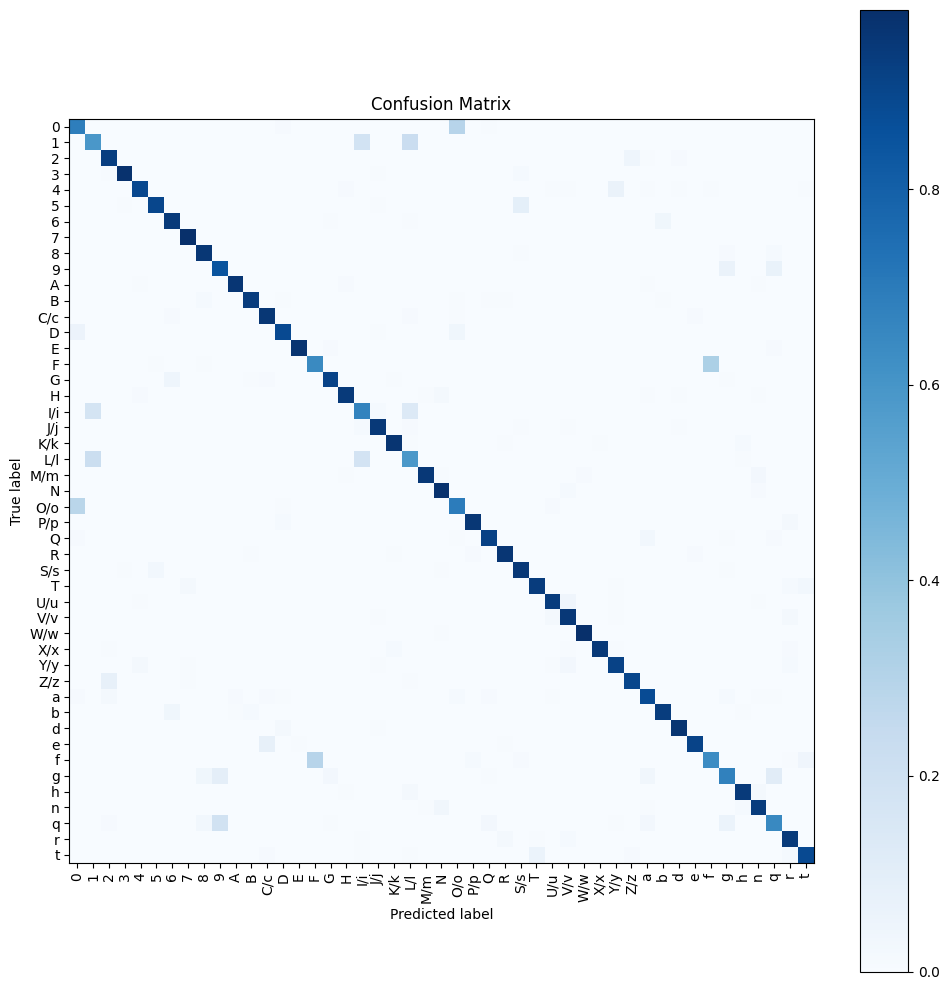

In [135]:
y_test2 = []
# Iterate over the batches of data
for batch_data, batch_labels in test_ds2:
    # Append the batch labels to the list of labels
    y_test2.append(batch_labels)
# Concatenate the list of labels into a single numpy array
y_test2 = tf.concat(y_test2, axis=0).numpy()


#Predict
y_model2 = special_model.predict(test_ds2)
y_model2 = np.argmax (y_model2, axis = 1)


#Create confusion matrix and normalizes it over predicted (columns)
cm2 = confusion_matrix(y_test2, y_model2 , normalize='pred')

# Define the class names
class_names = [f'{map_labels_to_ascii(i)}' for i in range(47)]

# Compute the confusion matrix
cm_norm2 = cm2.astype('float') / cm2.sum(axis=1)[:, np.newaxis]

# Create a new figure with a larger size
plt.figure(figsize=(10, 10))

# Plot the confusion matrix
plt.imshow(cm_norm2, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=90)
plt.yticks(tick_marks, class_names)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Show the plot
plt.show()


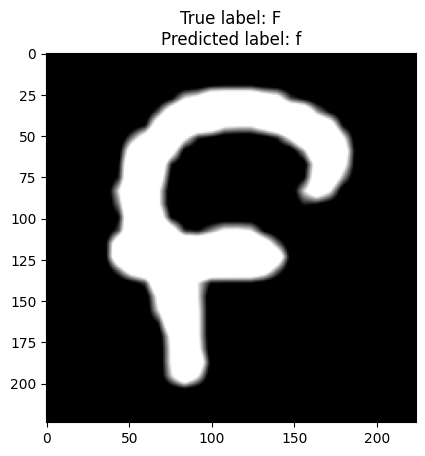

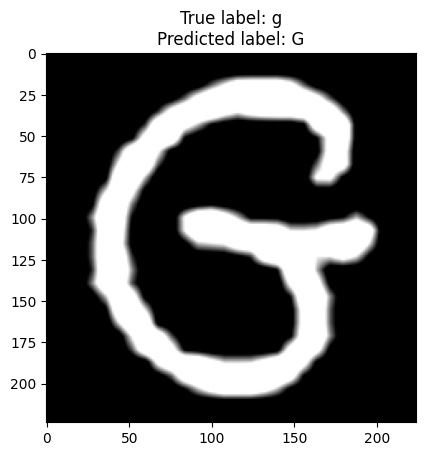

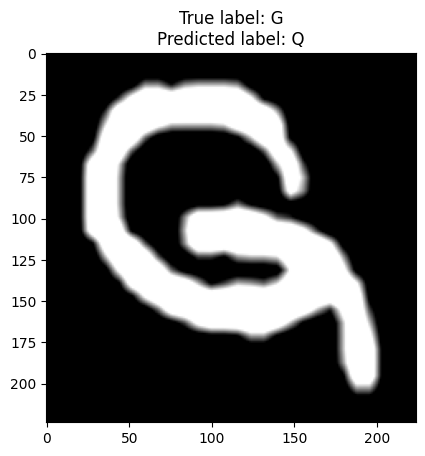

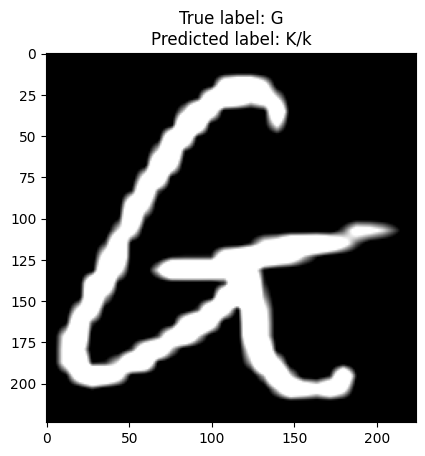

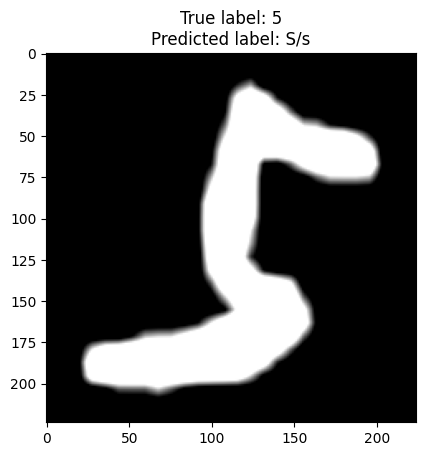

...

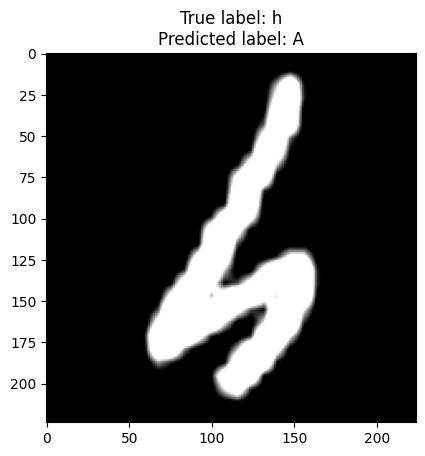

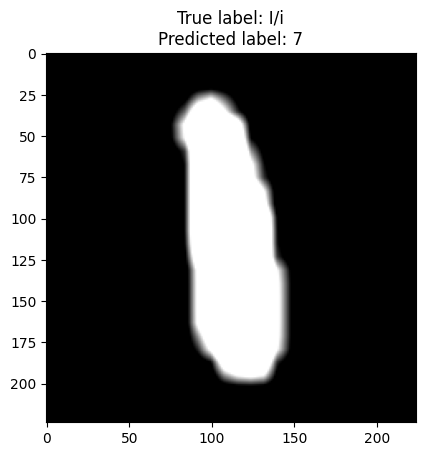

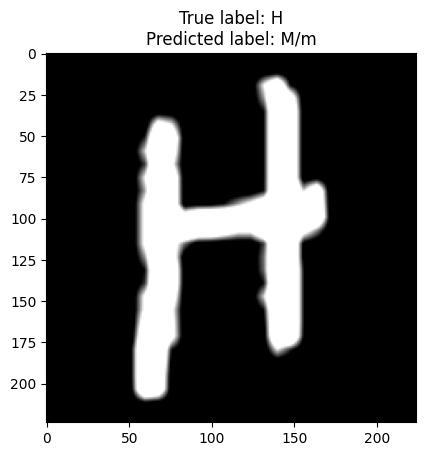

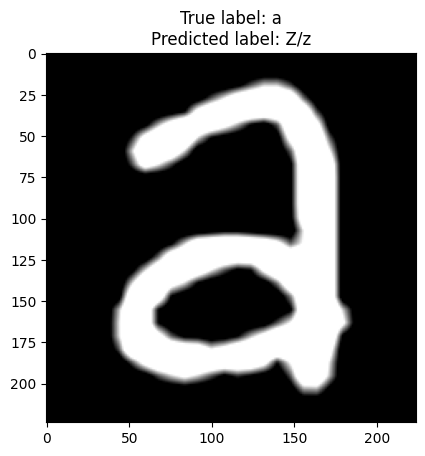

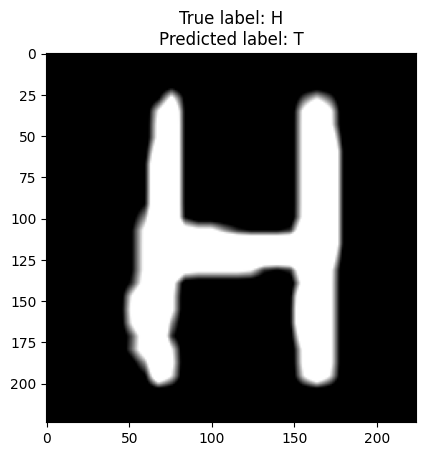

KeyboardInterrupt: 

In [170]:
# Given test_ds2, y_model2, y_test2, plot all misclassified images
def plot_misclassified_images(test_ds2, y_model2, y_test2):
    # Iterate over the batches of data
    for batch_data, batch_labels in test_ds2:
        # Iterate over the images and labels of the current batch
        for image, label, predicted_label in zip(batch_data, batch_labels, y_model2):
            # If the predicted label does not match the true label
            if label != predicted_label:
                # Plot the image
                plt.imshow(image)
                # Set the title to be the true and predicted labels
                plt.title(f"True label: {map_labels_to_ascii(label)}\nPredicted label: {map_labels_to_ascii(predicted_label)}")
                # Show the plot
                plt.show()

plot_misclassified_images(test_ds2, y_model2, y_test2)

##### Large

In [141]:
base_model_large = keras.applications.MobileNetV3Large(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(MY_K, MY_K, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

In [142]:
base_model_large.trainable = False

In [143]:
n_layers_with_padding = 4
n_layers_WITHOUT_padding = 1
doBatchNorm = True
layers_with_padding = []
nF1 = 32
activation_fun_str = "leaky_relu"
doUseBias = False
dropout = 0.4

for i in range(n_layers_with_padding):
    layers_with_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), padding="same" , activation=activation_fun_str, use_bias=doUseBias) )
    if doBatchNorm:
        layers_with_padding.append( layers.BatchNormalization() )
    layers_with_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(1,1),padding="same") )

layers_WITHOUT_padding = []
for i in range(n_layers_WITHOUT_padding):
    layers_WITHOUT_padding.append( layers.Conv2D(nF1*(i+1), kernel_size=(3, 3), activation=activation_fun_str,  use_bias=doUseBias) )
    if doBatchNorm:
        layers_WITHOUT_padding.append( layers.BatchNormalization() )
    layers_WITHOUT_padding.append( layers.MaxPooling2D(pool_size=(2, 2), strides=(2,2)) )
    layers_WITHOUT_padding.append(layers.Dropout(dropout))


model_who_transfer_learning_is_applied2 = keras.Sequential(
    [
        # keras.Input(shape=INPUT_SHAPE),
        *layers_with_padding,
        *layers_WITHOUT_padding,
        # layers.Flatten(),
        # layers.Dense(N_CLASSES, activation="softmax"),
    ]
)

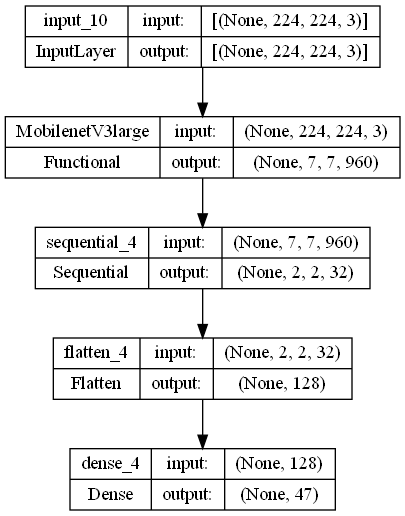

In [145]:
inputs = tf.keras.Input(shape=(MY_K, MY_K, 3))

# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model_large(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = model_who_transfer_learning_is_applied2(x)
x = layers.Flatten()(x)

# A Dense classifier with a single unit (binary classification)
outputs = tf.keras.layers.Dense(N_CLASSES, activation="softmax")(x)
special_model_large = tf.keras.Model(inputs,outputs)

keras.utils.plot_model(special_model_large, show_shapes=True)

In [146]:
callbacks4 = [
    tf.keras.callbacks.EarlyStopping(VAL_LOSS, patience=3, restore_best_weights=True)
]
EPOCHS_TRANSFER_LEARNING = 30
special_model_large.compile(optimizer=keras.optimizers.Adam(),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="sparse_top_k_categorical_accuracy", dtype=None)]
              )
special_model_large.fit(train_ds2, epochs=EPOCHS_TRANSFER_LEARNING, callbacks=callbacks4, validation_data=valid_ds2)

# Testing
score = special_model_large.evaluate(test_ds2)
print_all_metrics(special_model_large, score)

Epoch 1/30
313/313 [==============================] - 94s 289ms/step - loss: 1.0907 - accuracy: 0.6802 - sparse_top_k_categorical_accuracy: 0.9136 - val_loss: 0.5948 - val_accuracy: 0.8031 - val_sparse_top_k_categorical_accuracy: 0.9815
Epoch 2/30
313/313 [==============================] - 89s 285ms/step - loss: 0.4955 - accuracy: 0.8337 - sparse_top_k_categorical_accuracy: 0.9866 - val_loss: 0.4726 - val_accuracy: 0.8361 - val_sparse_top_k_categorical_accuracy: 0.9887
Epoch 3/30
313/313 [==============================] - 89s 286ms/step - loss: 0.4060 - accuracy: 0.8589 - sparse_top_k_categorical_accuracy: 0.9909 - val_loss: 0.4400 - val_accuracy: 0.8464 - val_sparse_top_k_categorical_accuracy: 0.9902
Epoch 4/30
313/313 [==============================] - 88s 280ms/step - loss: 0.3568 - accuracy: 0.8728 - sparse_top_k_categorical_accuracy: 0.9937 - val_loss: 0.4528 - val_accuracy: 0.8423 - val_sparse_top_k_categorical_accuracy: 0.9906
Epoch 5/30
313/313 [==============================] 

In [148]:
# Unfreeze the base model
base_model_large.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
special_model_large.compile(optimizer=keras.optimizers.Adam(1e-5), 
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy", tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="sparse_top_k_categorical_accuracy", dtype=None)]
                      )

# Train end-to-end. Be careful to stop before you overfit!
EPOCHS_FINE_TUNING = 20
special_model_large.fit(train_ds2, epochs=EPOCHS_FINE_TUNING, callbacks=callbacks4, validation_data=valid_ds2)


# Testing
score = special_model_large.evaluate(test_ds2)
print_all_metrics(special_model_large, score)

Epoch 1/20


ResourceExhaustedError: Graph execution error:

Detected at node 'model_2/MobilenetV3large/expanded_conv_7/depthwise/depthwise' defined at (most recent call last):
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\traitlets\config\application.py", line 1043, in launch_instance
      app.start()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelapp.py", line 712, in start
      self.io_loop.start()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\asyncio\base_events.py", line 603, in run_forever
      self._run_once()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\asyncio\base_events.py", line 1906, in _run_once
      handle._run()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\kernelbase.py", line 730, in execute_request
      reply_content = await reply_content
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\ipkernel.py", line 383, in do_execute
      res = shell.run_cell(
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\ipykernel\zmqshell.py", line 528, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\Jacopo\miniconda3\envs\tf\lib\site-packages\IPython\core\interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\Jacopo\AppData\Local\Temp\ipykernel_13740\2278021582.py", line 14, in <module>
      special_model_large.fit(train_ds2, epochs=EPOCHS_FINE_TUNING, callbacks=callbacks4, validation_data=valid_ds2)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 993, in train_step
      y_pred = self(x, training=True)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\layers\convolutional\depthwise_conv2d.py", line 161, in call
      outputs = backend.depthwise_conv2d(
    File "C:\Users\Jacopo\AppData\Roaming\Python\Python310\site-packages\keras\backend.py", line 6315, in depthwise_conv2d
      x = tf.compat.v1.nn.depthwise_conv2d(
Node: 'model_2/MobilenetV3large/expanded_conv_7/depthwise/depthwise'
OOM when allocating tensor with shape[256,14,14,200] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_2/MobilenetV3large/expanded_conv_7/depthwise/depthwise}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_function_17879487]

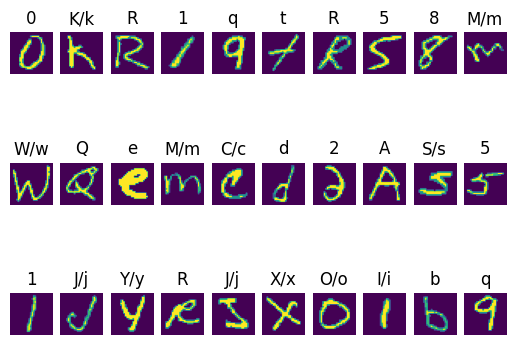

In [159]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)

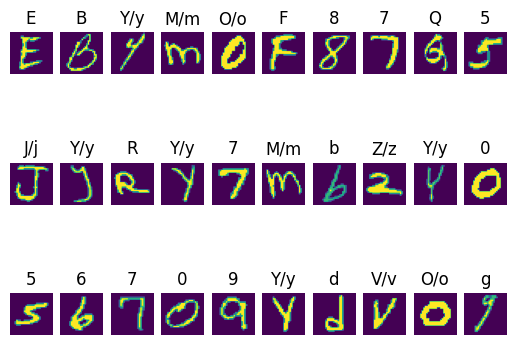

In [160]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)

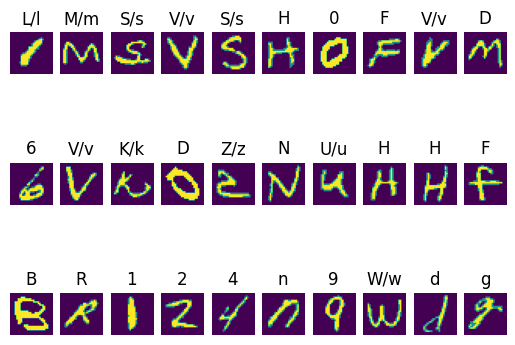

In [161]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)

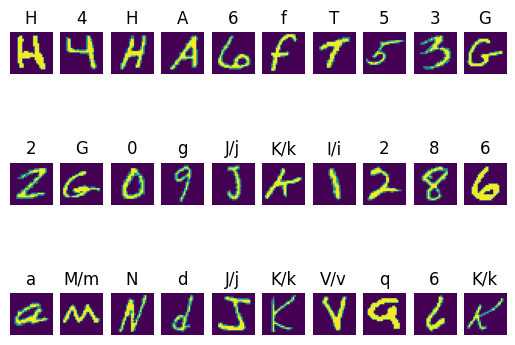

In [162]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)

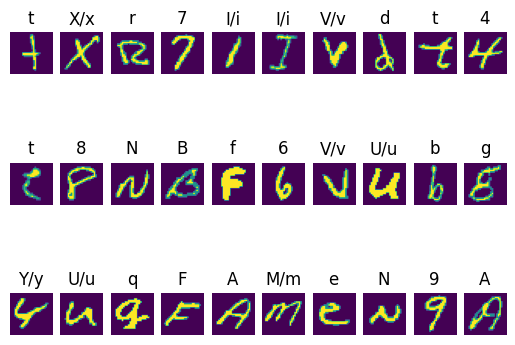

In [163]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)

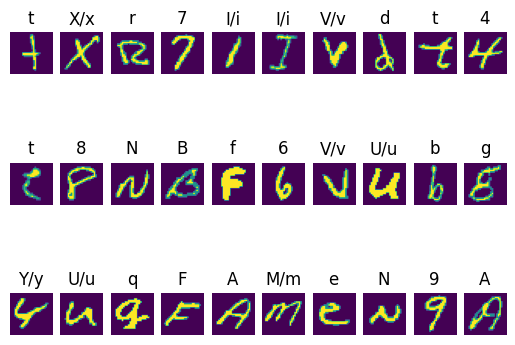

In [164]:
# print images and their labels using print_images function
plot_images(test_ds,n_img_to_show=30, nrows=3, ncols=10)